# Project: Advanced Lane Finding

## Introduction


## Camera Calibration

Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [51]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

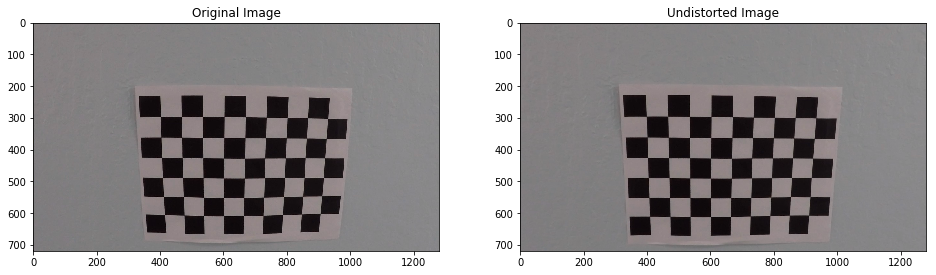

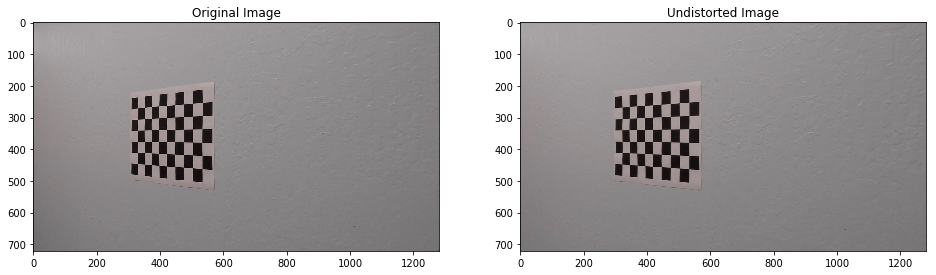

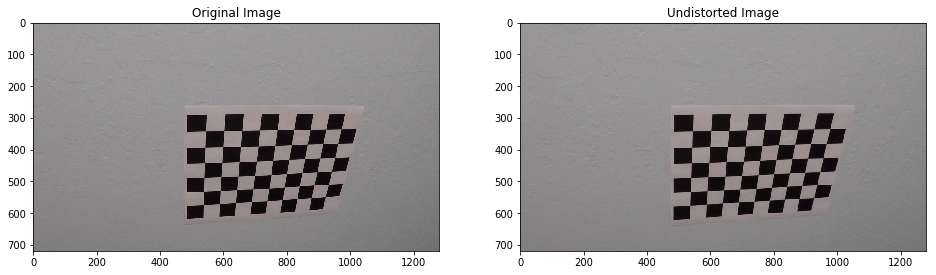

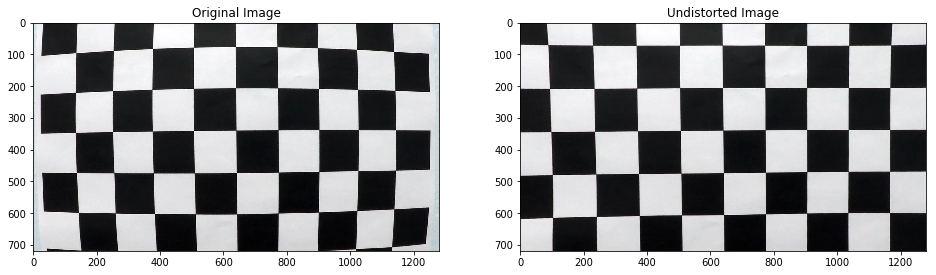

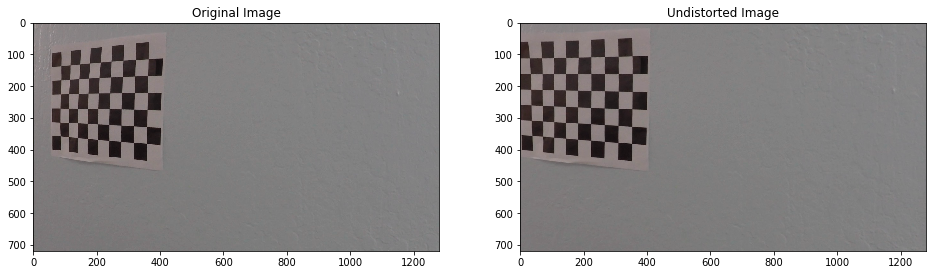

...

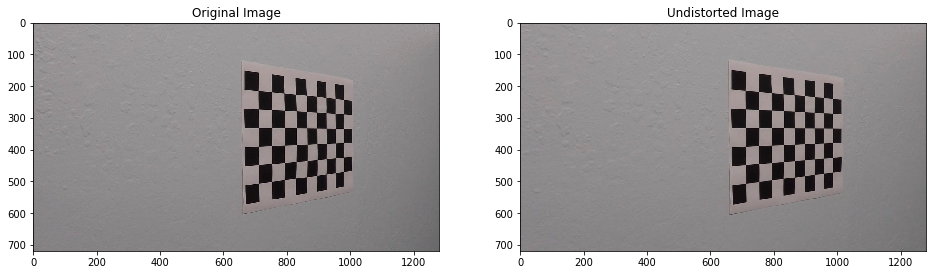

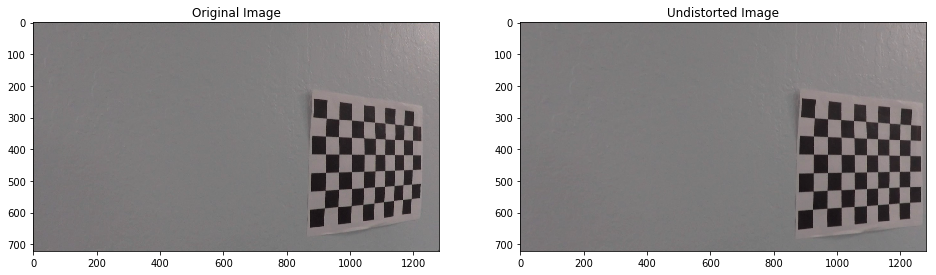

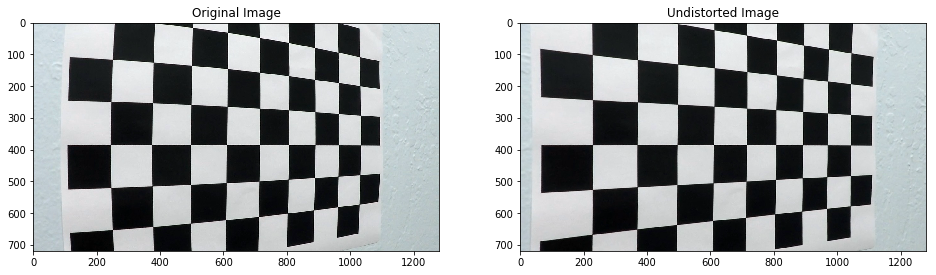

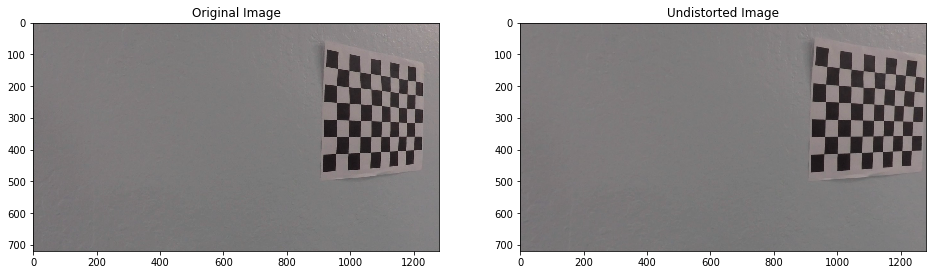

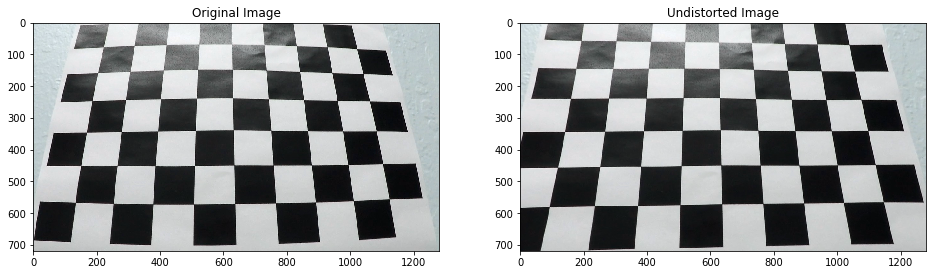

In [2]:
nx=9
ny=6

objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)# x, y, coordinates

# Make a list of calibration images
images = glob.glob('camera_cal/*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    #print('fname: ', fname)
    img = mpimg.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        # Draw and display the corners
        #cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        #plt.figure()
        #plt.imshow(img)
        
# calibrate the camera        
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# remove distortion from all the calibration images
for fname in images:
    img = mpimg.imread(fname)
    img_size = (img.shape[1], img.shape[0])
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=12)
    ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=12)
    
    cv2.imwrite(fname.replace('camera_cal/','output_images/').replace('.jpg', '-undistorted.jpg'), undist)

## Perspective Transformation

Assuming the road is a flat plane (an approximation made for this project), using images where lane lines are straight, identify four points we will later use as part of persepective transformation of the images.

In [3]:
def perspective_transform(img, mtx, dist):
    src = np.float32([
        top_left_point,
        top_right_point,
        bottom_right_point,
        bottom_left_point
     ])
    
    offset=350
    h=img.shape[0]
    w=img.shape[1]
    img_size = (w,h)
    
    dst = np.float32([
        [offset, 0], 
        [w-offset, 0], 
        [w-offset, h], 
        [offset, h]
    ])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped_img = cv2.warpPerspective(img, M, img.shape[1::-1], flags=cv2.INTER_LINEAR)
    
    return warped_img, M, Minv

In [37]:
# Define conversions in x and y from pixels space to meters
YM_PER_PIX = 3.048/100 # 10 ft (3.048 metres) is 1 line, which seems to be about 100 pixels high
XM_PER_PIX = 3.7/(1280-400) # 12ft (3.7m) is width of road, which we have at offsetted at 200 of width

shape: (720, 1280, 3)


True

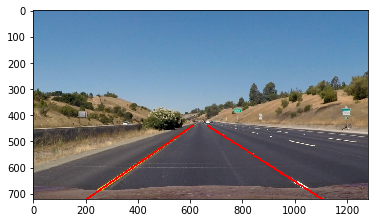

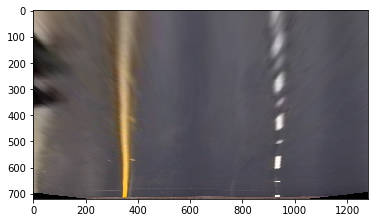

In [4]:
fname='test_images/straight_lines1.jpg'

#top_right_point=(734, 480)
#bottom_right_point=(1105, 720)
#bottom_left_point=(205,720)
#top_left_point=(550, 480)

top_right_point=(667, 440)
bottom_right_point=(1105, 720)
bottom_left_point=(205,720)
top_left_point=(611, 440)



img = mpimg.imread(fname)
print('shape:', img.shape)

warped_img, _, _ = perspective_transform(img, mtx, dist)

color=[255,0,0]
thickness=5
cv2.line(img, bottom_left_point, top_left_point, color, thickness)
cv2.line(img, bottom_right_point, top_right_point, color, thickness)

plt.imshow(img)
plt.figure()
plt.imshow(warped_img)

cv2.imwrite(fname.replace('test_images/','output_images/').replace('.jpg', '-warped-baseline.jpg'), 
            cv2.cvtColor(warped_img, cv2.COLOR_RGB2BGR))

## Region of Interest



In [5]:
def region_of_interest(img, vertices):

    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

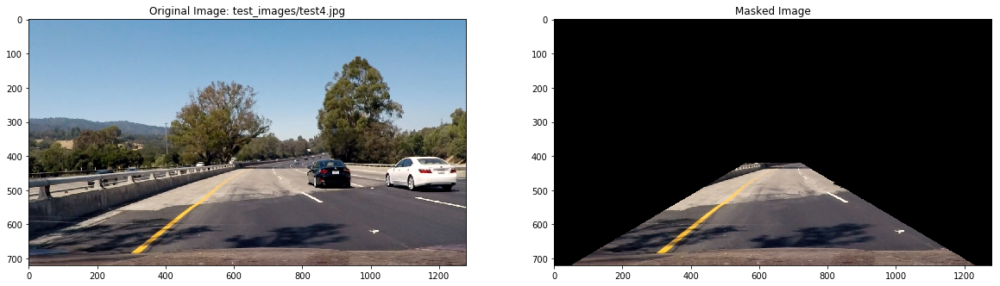

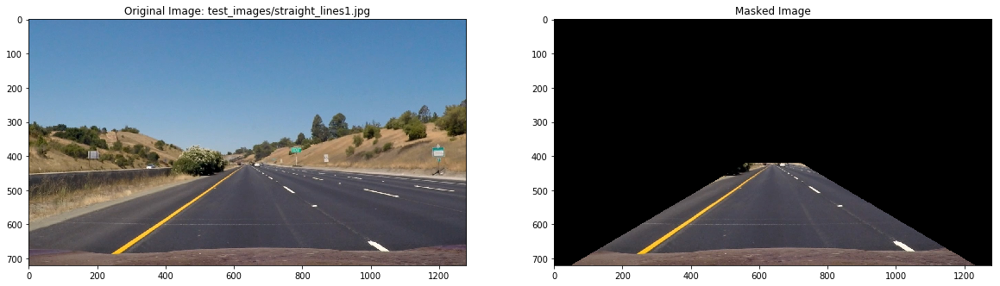

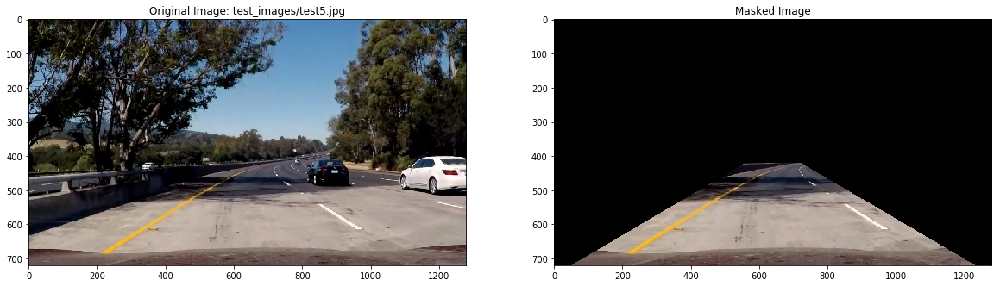

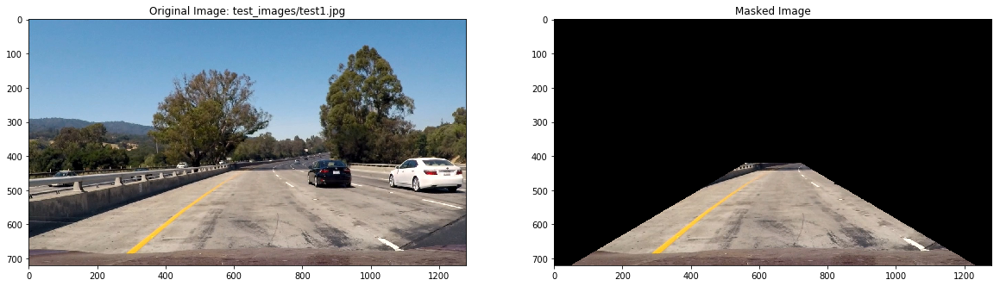

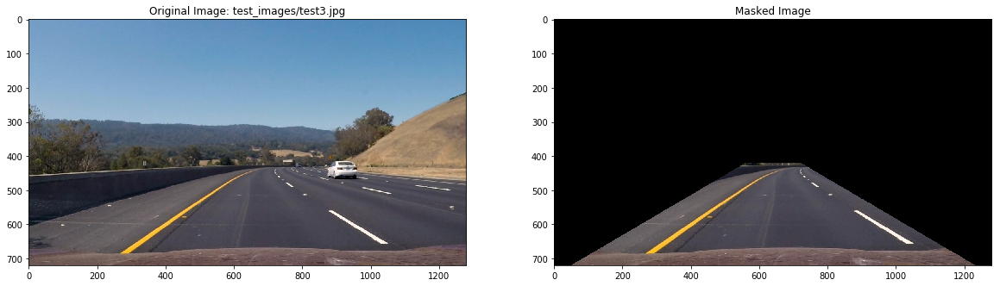

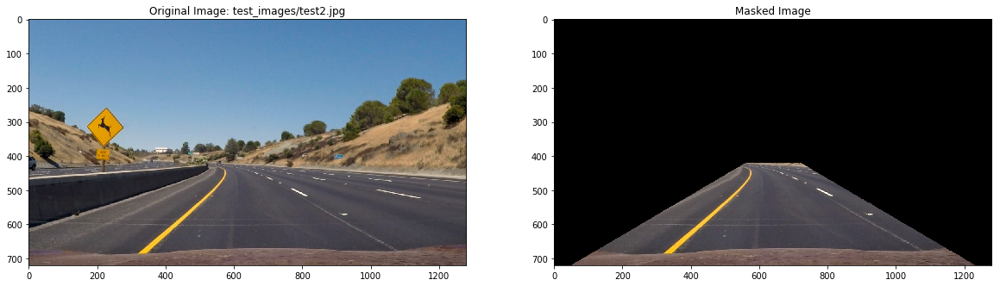

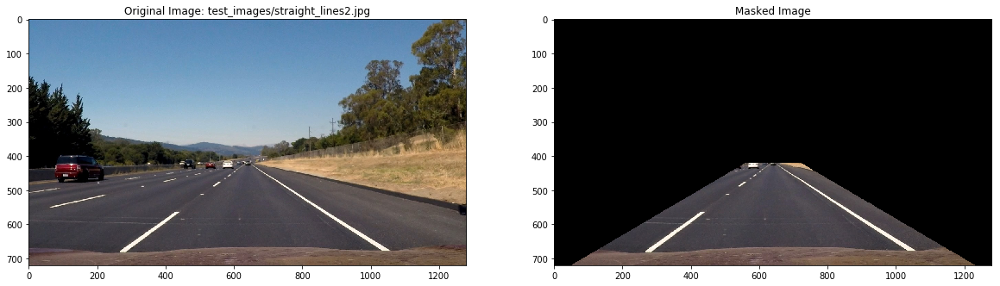

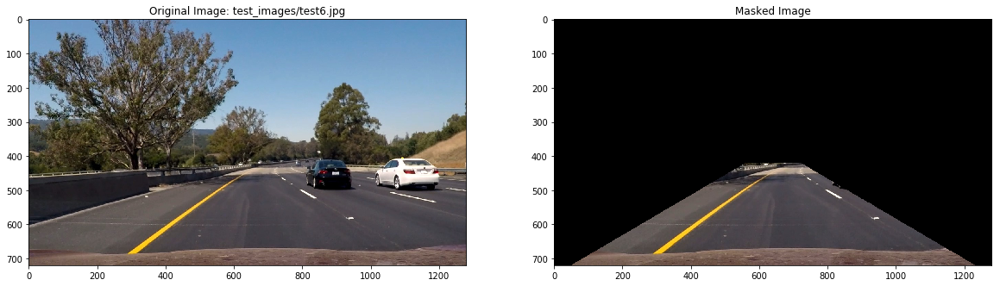

In [6]:
images = glob.glob('test_images/*.jpg')

top_right_region=(720, 420)
bottom_right_region=(1230, 720)
bottom_left_region=(50,720)
top_left_region=(560, 420)

mask_vertices = np.array([[top_right_region,bottom_right_region,bottom_left_region,top_left_region]], dtype=np.int32)
    
# Step through the list and search for chessboard corners
for fname in images:

    img = mpimg.imread(fname)

    #color=[255,0,0]
    #thickness=5
    #cv2.line(img, bottom_left_region, top_left_region, color, thickness)
    #cv2.line(img, bottom_right_region, top_right_region, color, thickness)

    masked_image = region_of_interest(img, mask_vertices)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Original Image: ' + fname)
    ax1.imshow(img)
    ax2.set_title('Masked Image')
    ax2.imshow(masked_image)
    

## Image Processing Pipeline

- Apply a distortion correction to raw images.
- Use color transforms, gradients, etc., to create a thresholded binary image.
- Apply a perspective transform to rectify binary image ("birds-eye view").
- Detect lane pixels and fit to find the lane boundary.
- Determine the curvature of the lane and vehicle position with respect to center.
- Warp the detected lane boundaries back onto the original image.
- Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [7]:
def distortion_correction(original_img, mtx, dist):
    undistorted_img = cv2.undistort(original_img, mtx, dist, None, mtx)
    return undistorted_img

In [12]:
def thresholded_binary_image(undistorted_img, thresh_min=20, thresh_max=100, s_thresh_min=180, s_thresh_max=255):
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(undistorted_img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    
    # Grayscale image
    gray = cv2.cvtColor(undistorted_img, cv2.COLOR_RGB2GRAY)
    
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary, color_binary

In [13]:
def fit_to_lane_boundary(binary_warped):
    # histogram of bottom half of image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    
    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    left_rectangles = []
    right_rectangles = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        ### Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # save rectangle data 
        left_rectangles.append((win_xleft_low,win_xleft_high,win_y_low,win_y_high))
        right_rectangles.append((win_xright_low,win_xright_high,win_y_low,win_y_high))
        
        ### Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
            (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
            (nonzerox > win_xright_low) & (nonzerox <= win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    ### Fit a second order polynomial to each using `np.polyfit` ###
    if len(leftx)>0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx)>0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    return leftx, lefty, rightx, righty, left_rectangles, right_rectangles, left_fit, right_fit


In [14]:
def fit_to_lane_boundary_prior(left_fit, right_fit, binary_warped):
    
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 80
    
    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & 
                    (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & 
                    (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    ### Fit a second order polynomial to each with np.polyfit() ###
    if len(leftx)>0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx)>0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    return leftx, lefty, rightx, righty, left_fit, right_fit


In [15]:
def draw_lane_boundary(leftx, lefty, rightx, righty, left_rectangles, right_rectangles, 
                       left_fit, right_fit, img):
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((img, img, img))
    
    # Draw the windows on the visualization image
    for rect in left_rectangles:
        cv2.rectangle(out_img,(rect[0],rect[2]), (rect[1],rect[3]),(0,255,0), 2) 
    for rect in right_rectangles:
        cv2.rectangle(out_img,(rect[0],rect[2]), (rect[1],rect[3]),(0,255,0), 2) 
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return left_fitx, right_fitx, ploty, out_img


In [45]:
def measure_curvature(leftx, lefty, rightx, righty, ploty):
    
    # Define y-value where we want radius of curvature
    y_eval = np.max(ploty)

    left_curverad_mt = 0
    right_curverad_mt = 0
    
    if len(leftx) > 0 and len(rightx) > 0:
        # Fit a second order polynomial to pixel positions in each fake lane line
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*YM_PER_PIX, leftx*XM_PER_PIX, 2)
        right_fit_cr = np.polyfit(righty*YM_PER_PIX, rightx*XM_PER_PIX, 2)
        
        # Calculation of R_curve (radius of curvature) in metres
        left_curverad_mt = ((1 + (2*left_fit_cr[0]*y_eval*YM_PER_PIX + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad_mt = ((1 + (2*right_fit_cr[0]*y_eval*YM_PER_PIX + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return int(left_curverad_mt), int(right_curverad_mt)

In [46]:
def measure_position(left_fit, right_fit, img_shape):
    h=img_shape[0]
    w=img_shape[1]
    
    offset=0
    if left_fit is not None and right_fit is not None:
        vehicle_position = w / 2
        left_fitx = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        right_fitx = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
        lane_center_position = (left_fitx + right_fitx) / 2
        offset = (vehicle_position - lane_center_position) * XM_PER_PIX
        
    return offset

In [17]:
def overlay_original_image(left_fitx, right_fitx, ploty, Minv, thresholded_binary_img, original_img):
    #print('left_fitx: ', left_fitx)
    #print('right_fitx: ', right_fitx)
    #print('ploty: ', ploty)
    #print('Minv: ', Minv)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(thresholded_binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    #cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (thresholded_binary_img.shape[1], thresholded_binary_img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(original_img, 1, newwarp, 0.3, 0)
    
    return result

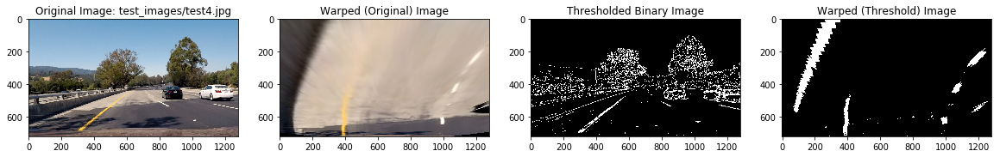

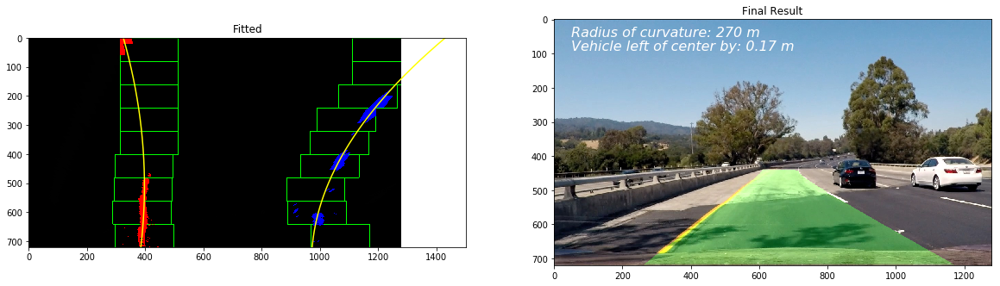

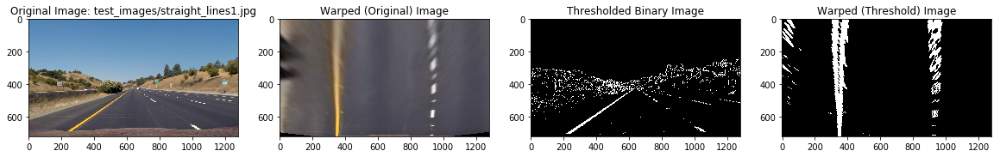

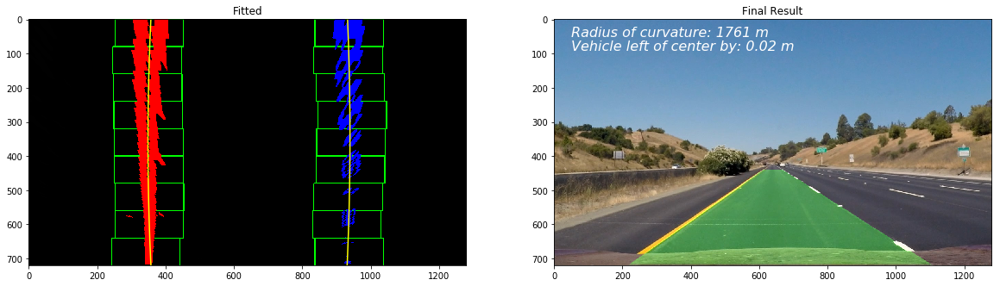

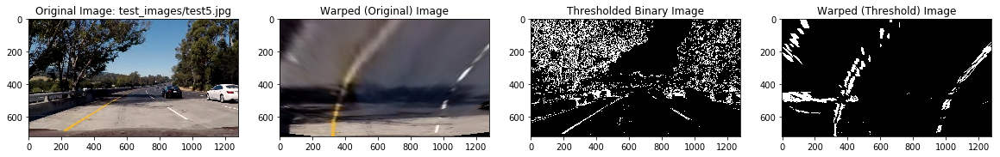

...

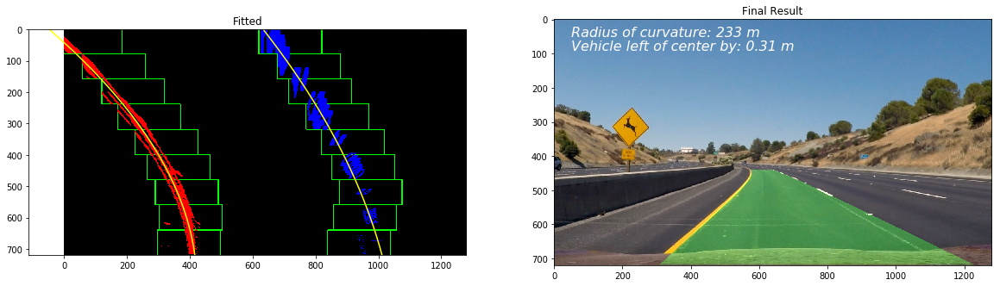

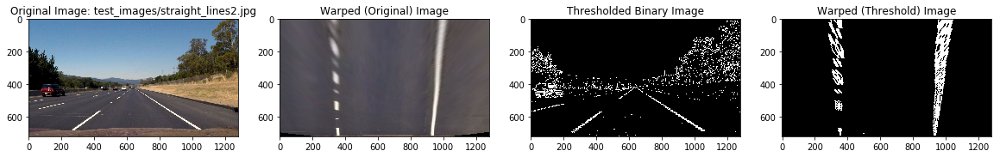

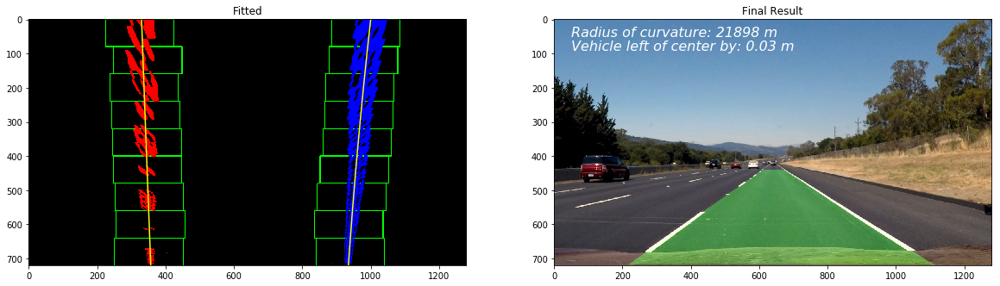

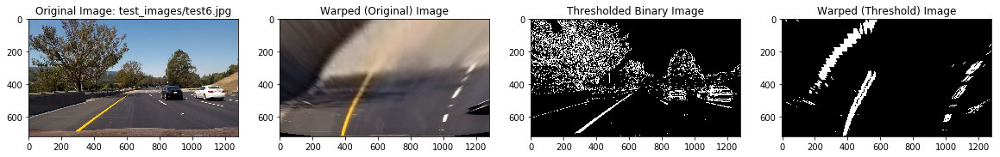

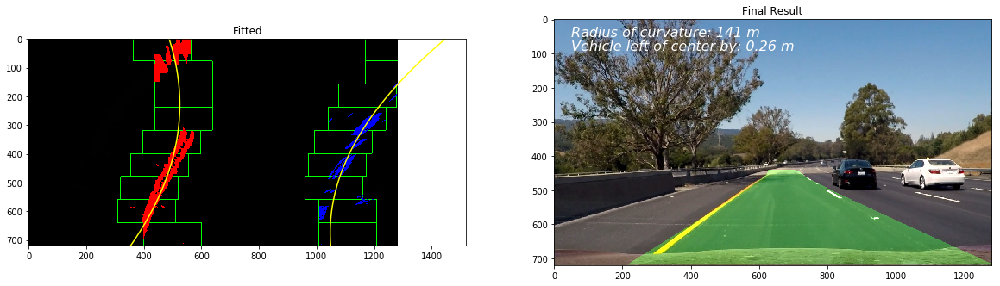

In [52]:
# test images
images = glob.glob('test_images/*.jpg')

# Step through the list and search for chessboard corners
for fname in images:

    #print('fname: ', fname)
    original_img = mpimg.imread(fname)  
    cv2.imwrite(fname.replace('test_images/','output_images/').replace('.jpg', '-original.jpg'), 
            cv2.cvtColor(original_img, cv2.COLOR_RGB2BGR))
    
    # correct for distortion
    undistorted_img = distortion_correction(original_img, mtx, dist)
    cv2.imwrite(fname.replace('test_images/','output_images/').replace('.jpg', '-undistorted.jpg'), 
            cv2.cvtColor(undistorted_img, cv2.COLOR_RGB2BGR))
    
    thresholded_binary_img, color_binary_img = thresholded_binary_image(undistorted_img)
    cv2.imwrite(fname.replace('test_images/','output_images/').replace('.jpg', '-color_binary.jpg'), 
                color_binary_img)
    cv2.imwrite(fname.replace('test_images/','output_images/').replace('.jpg', '-thresholded_binary.jpg'), 
                thresholded_binary_img*255)
    
    masked_img = region_of_interest(thresholded_binary_img, mask_vertices)
    cv2.imwrite(fname.replace('test_images/','output_images/').replace('.jpg', '-masked.jpg'), 
               masked_img*255)
    
    warped_original_img, M, Minv = perspective_transform(undistorted_img, mtx, dist)
    # warped_img, M, Minv = perspective_transform(thresholded_binary_img, mtx, dist)
    warped_img, M, Minv = perspective_transform(masked_img, mtx, dist)
    cv2.imwrite(fname.replace('test_images/','output_images/').replace('.jpg', '-warped.jpg'), 
                warped_img*255)
    
    leftx, lefty, rightx, righty, left_rectangles, right_rectangles, left_fit, right_fit = fit_to_lane_boundary(
        warped_img)
        
    left_fitx, right_fitx, ploty, lane_boundaries_img = draw_lane_boundary(
        leftx, lefty, rightx, righty,
        left_rectangles, right_rectangles,
        left_fit, right_fit, warped_img)
    cv2.imwrite(fname.replace('test_images/','output_images/').replace('.jpg', '-lane_boundaries.jpg'),
            cv2.cvtColor(lane_boundaries_img, cv2.COLOR_RGB2BGR))

    left_curverad_mt, right_curverad_mt = measure_curvature(
        leftx, lefty, rightx, righty, ploty)
    avg_curverad_mt = int((left_curverad_mt + right_curverad_mt) / 2)
    

    vehicle_offset_mt = measure_position (
        left_fit, right_fit, lane_boundaries_img.shape)
    
    #result_img = overlay_original_image(left_fitx, right_fitx, ploty, Minv, thresholded_binary_img, original_img)
    result_img = overlay_original_image(left_fitx, right_fitx, ploty, Minv, thresholded_binary_img, original_img)
    cv2.imwrite(fname.replace('test_images/','output_images/').replace('.jpg', '-result.jpg'),
            cv2.cvtColor(result_img, cv2.COLOR_RGB2BGR))
    
    # Plotting  images
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,10))
    ax1.set_title('Original Image: ' + fname)
    ax1.imshow(original_img)
    ax2.set_title('Warped (Original) Image')
    ax2.imshow(warped_original_img, cmap='gray')
    ax3.set_title('Thresholded Binary Image')
    ax3.imshow(thresholded_binary_img, cmap='gray')
    ax4.set_title('Warped (Threshold) Image')
    ax4.imshow(warped_img, cmap='gray')
    
    f, (ax5, ax6) = plt.subplots(1, 2, figsize=(20,10))
    ax5.set_title('Fitted')
    ax5.imshow(lane_boundaries_img, cmap='gray')
    # Plots the left and right polynomials on the lane lines    
    ax5.plot(left_fitx, ploty, color='yellow')
    ax5.plot(right_fitx, ploty, color='yellow')
    ax6.set_title('Final Result')
    ax6.imshow(result_img)
    

    ### calculate the curvature radius and distance from offset of center
    ax6.text(50, 50, 'Radius of curvature: {} m'.format(avg_curverad_mt), 
             style='oblique', color='white', fontsize=16)
    if vehicle_offset_mt < 0:
        ax6.text(50, 90, 'Vehicle left of center by: {:.2f} m'.format(np.abs(vehicle_offset_mt)), 
             style='oblique', color='white', fontsize=16)
    else:
        ax6.text(50, 90, 'Vehicle right of center by: {:.2f} m'.format(vehicle_offset_mt), 
             style='oblique', color='white', fontsize=16)
    


## Video Processing Pipeline

In [19]:
# Define a class to receive the characteristics of each line detection
from collections import deque
class Line():
    def __init__(self, n=5):
        
        # was the line detected in the last iteration?
        self.detected = False 
        
        # x values of the last n fits of the line
        self.recent_xfitted = deque(maxlen=n)
        
        #average x values of the fitted line over the last n iterations
        #self.bestx = None  
        
        #polynomial coefficients averaged over the last n iterations
        #self.best_fit = None  
        self.recent_fitted = deque(maxlen=n)  
        
        #polynomial coefficients for the most recent fit
        self.current_fit = None
        
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
        #x values for detected line pixels
        self.allx = None  
        
        #y values for detected line pixels
        self.ally = None  
    
    def bestx(self):
        return np.mean(self.recent_xfitted, axis=0)
    
    def best_fit(self):
        return np.mean(self.current_fit, axis=0)
    
    def update(self, xfit, fit, curvature, offset, x, y):
        self.detected = (len(xfit)>0)
        self.recent_xfitted.append(xfit)
        self.recent_fitted.append(fit)
        self.current_fit = fit
        self.radius_of_curvature=curvature
        self.line_base_pos=offset
        self.allx=x
        self.ally=y

In [48]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML


def process_frame(original_img):
    
    # correct for distortion
    undistorted_img = distortion_correction(original_img, mtx, dist)
    
    thresholded_binary_img, _ = thresholded_binary_image(undistorted_img)
    
    masked_img = region_of_interest(thresholded_binary_img, mask_vertices)
    
    #warped_img, M, Minv = perspective_transform(thresholded_binary_img, mtx, dist)
    warped_img, M, Minv = perspective_transform(masked_img, mtx, dist)
    
    if left_line.detected == False or right_line.detected == False:
        leftx, lefty, rightx, righty, left_rectangles, right_rectangles, left_fit, right_fit = fit_to_lane_boundary(
            warped_img)
    else:
        left_rectangles=[]
        right_rectangles=[]
        leftx, lefty, rightx, righty, left_fit, right_fit = fit_to_lane_boundary_prior(
            left_line.current_fit, right_line.current_fit, warped_img)
                
    left_fitx, right_fitx, ploty, lane_boundaries_img = draw_lane_boundary(
        leftx, lefty, rightx, righty,
        left_rectangles, right_rectangles,
        left_fit, right_fit, warped_img)

    left_curverad_mt, right_curverad_mt = measure_curvature(
        leftx, lefty, rightx, righty, ploty)
    avg_curverad_mt = int((left_curverad_mt + right_curverad_mt) / 2)
    
    vehicle_offset_mt = measure_position (
        left_fit, right_fit, lane_boundaries_img.shape)
    
    result_img = overlay_original_image(left_fitx, right_fitx, ploty, Minv, thresholded_binary_img, original_img)
    
    ### display the curvature radius and distance from offset of center
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontScale = 1
    fontColor = (255,255,255)
    lineType = 2
    cv2.putText(result_img,'Radius of curvature: {}m'.format(avg_curverad_mt), 
        (50,50), font, fontScale, fontColor, lineType)

    if vehicle_offset_mt < 0:
        direction='left'
    else:
        direction='right'
        
    cv2.putText(result_img,'Vehicle {} off center by: {:.2f} m'.format(direction, np.abs(vehicle_offset_mt)), 
            (50,90), font, fontScale, fontColor, lineType)
    
    left_line.update(left_fitx, left_fit, left_curverad_mt, vehicle_offset_mt, leftx, lefty)
    right_line.update(right_fitx, right_fit, right_curverad_mt, vehicle_offset_mt, rightx, righty)
        
    return result_img
    

In [49]:
output_video='output_images/project_video.mp4'
input_video = VideoFileClip('./project_video.mp4') #.subclip(0,2)

left_line = Line()
right_line = Line()

processed_video = input_video.fl_image(process_frame) 
%time processed_video.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_images/project_video.mp4
[MoviePy] Writing video output_images/project_video.mp4


100%|█████████▉| 1260/1261 [05:11<00:00,  4.12it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video.mp4 

CPU times: user 2min 58s, sys: 3.27 s, total: 3min 1s
Wall time: 5min 14s


In [50]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))